# Graphing 

## Downloading and setting up the data
We're going to use a dataset measuring the degree of legislative professionalism in the U.S. states (legislative professionalism is typically thought of as resources or capacity of the legisature and is measured using some combination of legislature salary, staff or expenditures, and time in session, following Squire (1992). 

The ***copy*** command can, well, copy the file from your computer or from the web. Here, we're coming a zipped (compressed) folder from my github repository and saving it on our local computer. The ***unzip*** file decompresses the file. Finally, we can see what files are in our working directory using the ***dir*** command. _Note: if you're using a Mac or Linux computer, you need to use ***ls*** instead of ***dir***, which only works on Windows._ 

In general, graphing using a script ranges from very, very simple to incredibly complex. You can create a simple graph with an easy command, like _scatter y x_ (to create a scatterplot). But in order to make the graph look the way you want, you may want to change everything about the graph - the color and size of the dots, the x and y axis titles and labels, the color of the background, the placement of the legend - and the code can get very complex. Sometimes it is easier for beginning students to play around with the drop-down menu to create the graph. Also, Stata's help files are useful when learning the code. Type _help scatter_ or _help histogram_ to view the help file for the graph command you want. 

In [1]:
* Set working directory
quietly cd c:\Users\bowen\OneDrive\Courses\Political_Analysis\Labs\F2020\

* download the dataset (included in a compressed folder ending in .zip)
*    and save it to your working director. 
*    The copy command will make a copy of the dataset located at the url
*    and write it to your computer, calling it whatever you name
*    you include at the end of the command 
copy https://github.com/bowendc/labs/raw/master/legprof.zip ///
   legprof.zip

*decompress the file using the unzipfile command
unzipfile legprof.zip, replace

* let's see what files we have:
*    IMPORTANT: Mac or Linux users will need to use "ls" instead of "dir"

dir legprof* 





    inflating: legprof-components.v1.1.1.dta
    inflating: region.do

successfully unzipped legprof.zip to current directory
total processed:  2
        skipped:  0
      extracted:  2

  84.5k  10/07/20  8:35  legprof-components.v1.1.1.dta
  34.1k  10/07/20  8:35  legprof.zip       


Now let's open up the dataset and run the included _region.do_ do file to code the states by Census region. Then, let's add a label to our new region variable. Our dataset should now be ready for analysis.

In [2]:
* Open the legislative professionalism dataset
use legprof-components.v1.1.1.dta, clear
* Run region.do to code US states by Census regions:
do region.do
label define lab_reg 1 "Northeast" 2 "Midwest" 3 "South" 4 "West"
label values region lab_reg


(Legislative Professionalism Components, 1973-2014)


. #delimit ;
delimiter now ;
. set more off;

. gen region=.;
(1,050 missing values generated)

. replace region=1 if stateabv=="ME" ||
>                         stateabv=="NH" ||
>                         stateabv=="VT" ||
>                         stateabv=="CT" ||
>                         stateabv=="MA" ||
>                         stateabv=="RI" ||
>                         stateabv=="NY" ||
>                         stateabv=="NJ" ||
>                         stateabv=="PA";
(189 real changes made)

. replace region=2 if stateabv=="OH" ||
>                         stateabv=="MI" ||
>                         stateabv=="IN" ||
>                         stateabv=="IL" ||
>                         stateabv=="IA" ||
>                         stateabv=="WI" ||
>                         stateabv=="MN" ||
>                         stateabv=="ND" ||
>                         stateabv=="SD" ||
>                         stateabv=="NE" |

## Univariate distributional graphs

Univariate (one variable) distributional graphs are excellent ways to show the data to your readers. ***histogram*** presents distributions as bars. A central element of a histogram is that you can change the width the bars and therefore change the look of the graph. Kernal density plots, using the ***kdensity***, command, show estimated probability density functions (pdfs) of a variable using a line or area to visualize the shape of the distribution. 

### histogram


(bin=29, start=36, width=16.753448)


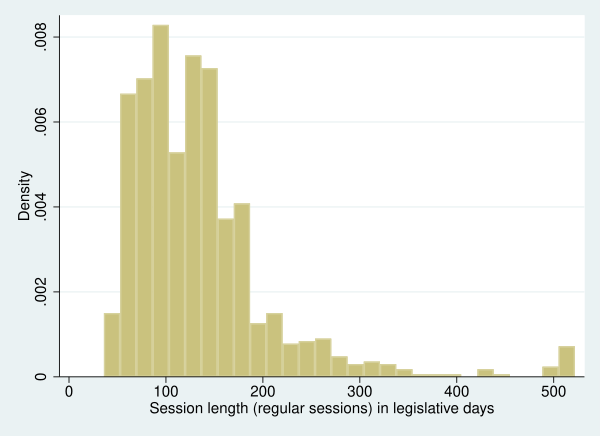



(bin=29, start=36, width=16.753448)


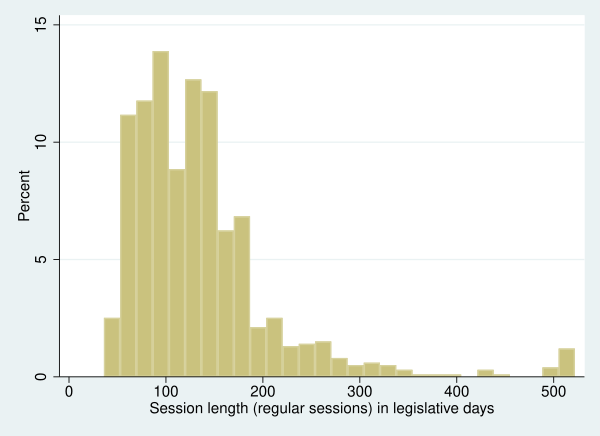



(bin=11, start=0, width=50)


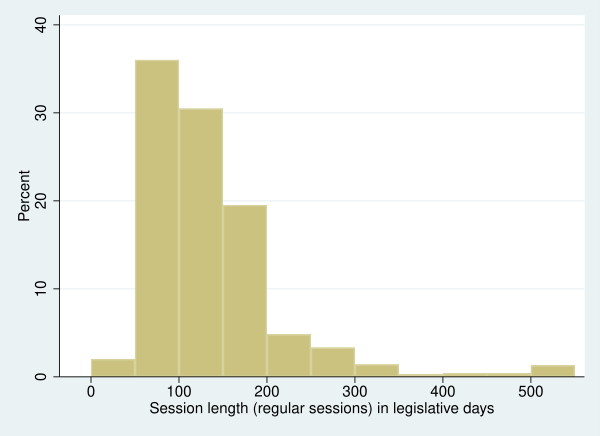



(bin=11, start=0, width=50)


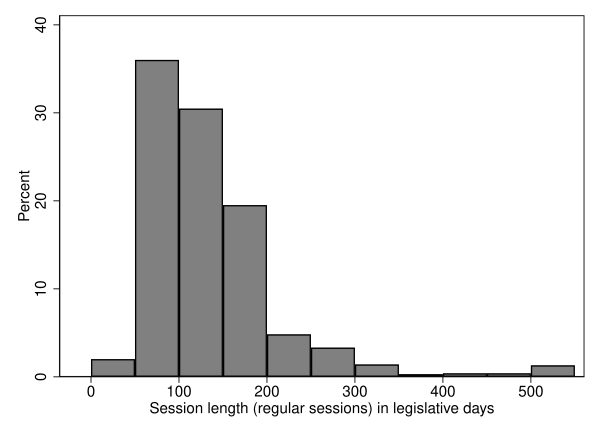

In [3]:
* Distributional graphs: histograms and kernel density plots
histogram slength
* change the y axis from "density" to "percent" using percent option
histogram slength, percent
* change the width of each bar, called "bins", first bin starts at 0
histogram slength, percent width(50) start(0)
* change the default graph style to the preset "s1mono" style
histogram slength, percent width(50) start(0) scheme(s1mono)

### kdensity

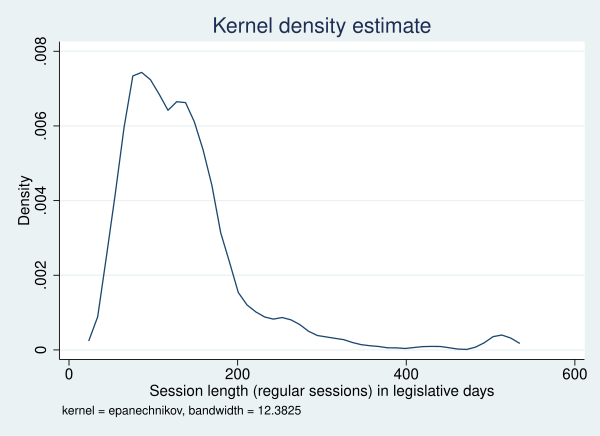

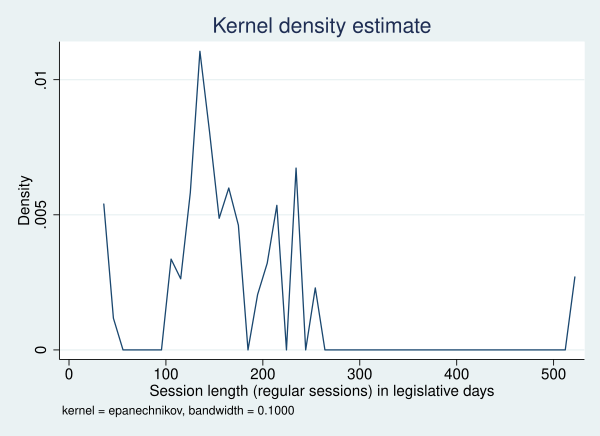

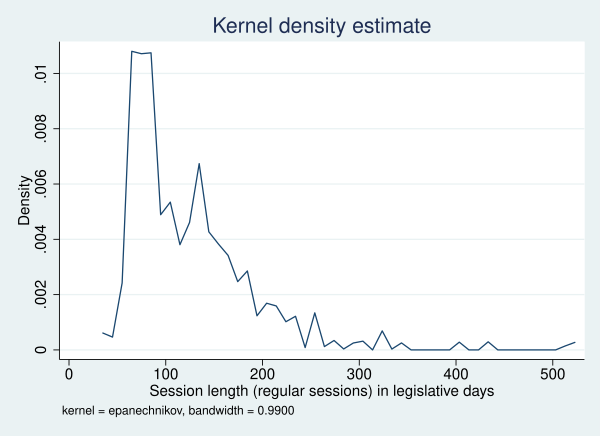

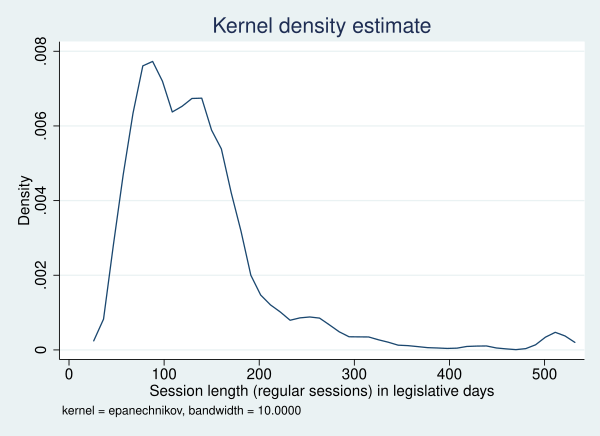

In [4]:
* kernel density plots 
* syntax: kdensity varname
kdensity slength

* the bwidth() option controls the sensitivity of the distribution line to the data
*    The bigger the bandwidth value, the greater the smoothing
kdensity slength, bwidth(.1)
kdensity slength, bwidth(.99)
kdensity slength, bwidth(10)

***twoway*** plots are some of the common (and useful) Stata graphs. ***twoway*** plots adopt a common syntax for a wide range of different plot types and let us combine multiple plots in the same 2-dimensional space. We can use ***twoway kdensity*** to create a kernal density plot with slightly different default settings but more flexibility in the look of the graph. 

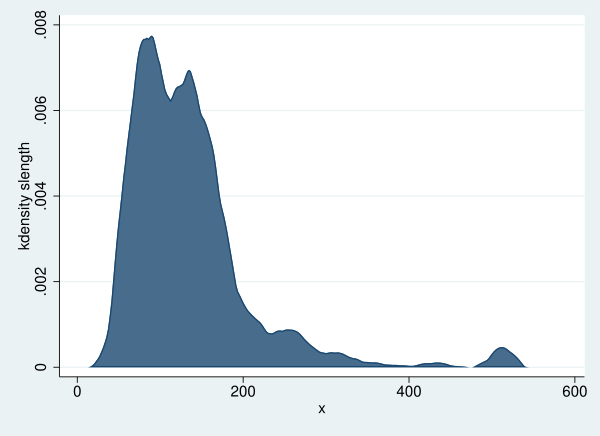

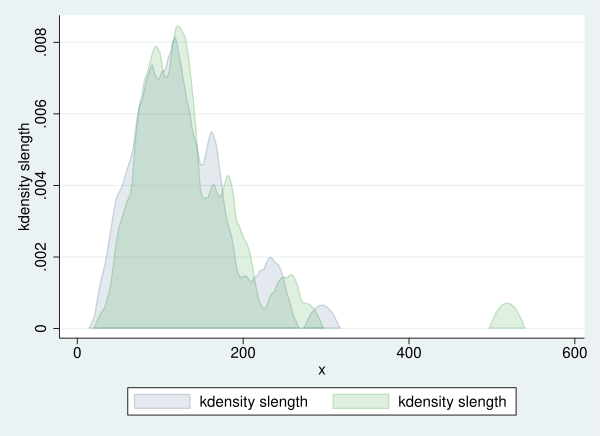

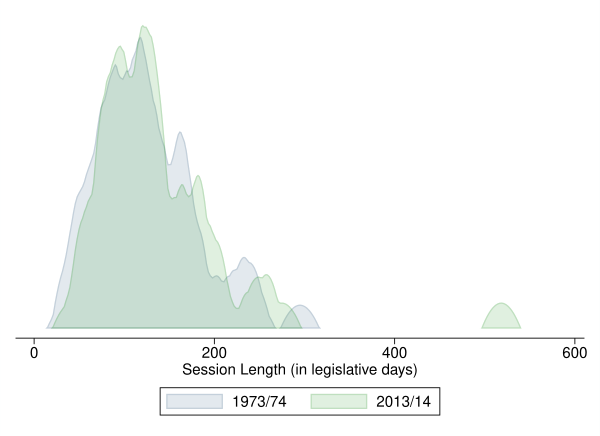

In [5]:
* More kdensity. I like using the twoway kdensity instead of the kdensity graph
* the recast(area) option switches the plot from a line graph of the shape of the
*    probability density function to an area plot of the same
* the range() option expands the graph beyond range of the data 
*    and allows a more attractive beginning and ending of the plot

twoway kdensity slength, bwidth(10) recast(area) range(-10 600)

* In all twoway plots, we can string together multiple graphs in the same
*   2-dimensional plot space using "||" between plots
* the "color(navy%15)" option changes the color of the graph to navy and sets the
*    opacity at 15 percent - allowing the viewer to see overlapping graphs
twoway  kdensity slength if sessid==1, bwidth(10) recast(area) range(-10 600) ///
            color(navy%15) || ///
        kdensity slength if sessid==21, bwidth(10) recast(area) range(-10 600) ///
            color(green%15)

* Here I add other changes:
*   xtitle() controls the title for xaxis (and ytitle controls the title for the yaxis)
*   legend() options allowing a number of changes to the legend, including suppressing
*         it altogether. Here, I change the labels
*   graphregion(color(white)) changes exterior region of the graph from Stata's
*         default bluish-gray to white.
*   ylabel() controls the ticks/labels on yaxis and yscale(off) suppresses the 
*         yaxis entirely
twoway  kdensity slength if sessid==1, bwidth(10) recast(area) range(-10 600) ///
            color(navy%15) || ///
        kdensity slength if sessid==21, bwidth(10) recast(area) range(-10 600) ///
            color(green%15) ///
        xtitle(Session Length (in legislative days)) ///
        legend( label(1 "1973/74") label(2 "2013/14")) ylabel(none) yscale(off) ///
        graphregion(color(white)) 


## Multivariate comparisons graphs

Bar graphs (***graph bar***) and dot plots (***graph dot***) display statics of one variable (usually the dependent variable), over categories of a second or third variable (usually the independent variable). Whether you use bars or graphs is mostly a stylistic choice, but each graph type has its own advantages and disadvantages.

### graph bar

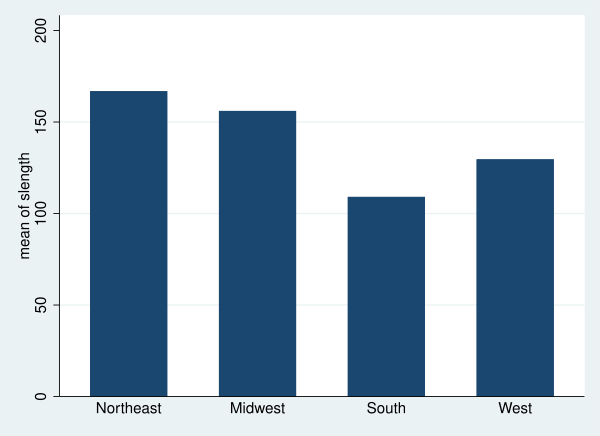

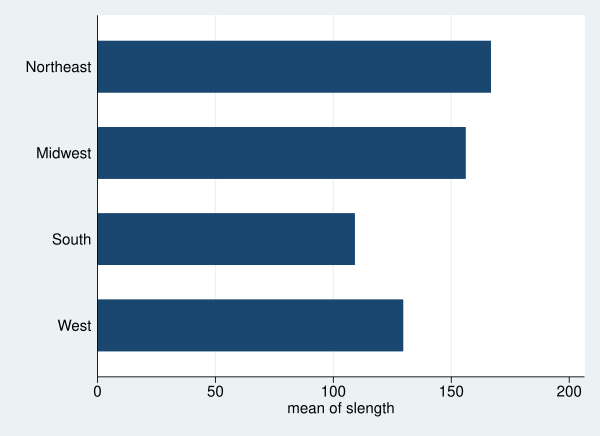

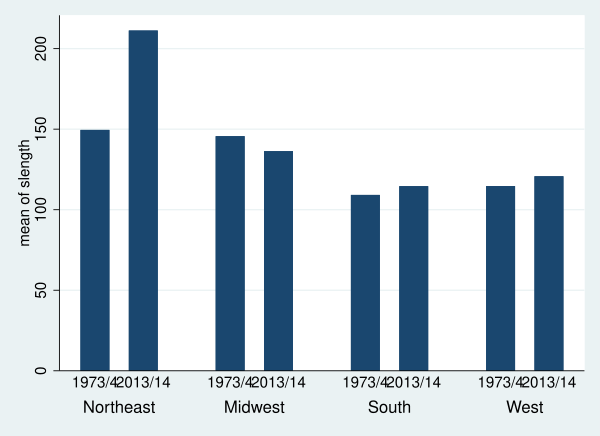

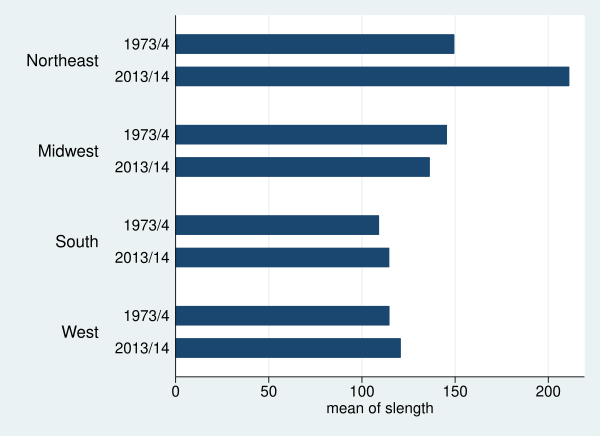

In [6]:
* Stata's bar graphs are inherently bivariate. They are made to display a 
*    statistic of one value over the categories of another. Works great as
*    a way to display mean comparison tests
* syntax: graph bar (statistic) y, over(x)
graph bar (mean) slength, over(region)

* We can also switch to a horizonital bar graph using "graph hbar"
* Note that (mean) is the default statistic, so it is not necessary
*     that you specify it in the command
graph hbar slength, over(region)

* Add in third variable: time (use sessid variable)
*     to make the graph readable, let's only display the first and last time period
graph bar slength if sessid==1 | sessid==21, over(sessid) over(region)
graph hbar slength  if sessid==1 | sessid==21, over(sessid) over(region)



### graph dot
While dot plots can be used just like the bar graphs above, I often use them to show the ranking or distrubtion of a variable. Below, we look at the average session length by state across the dataset. 

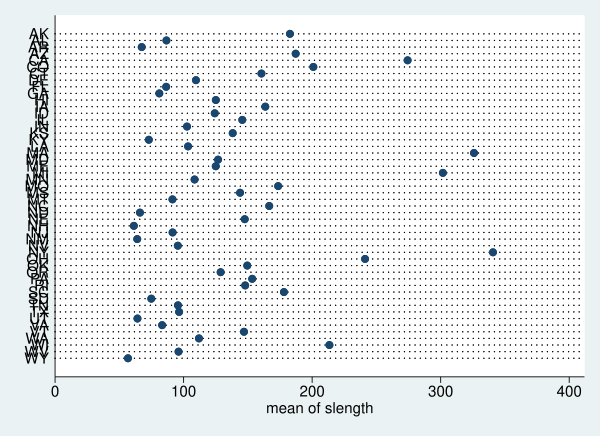

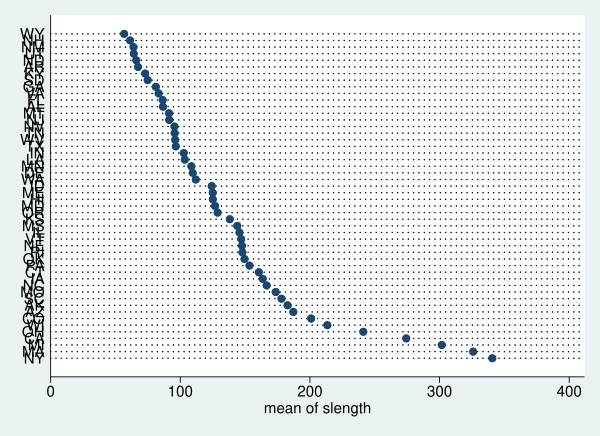

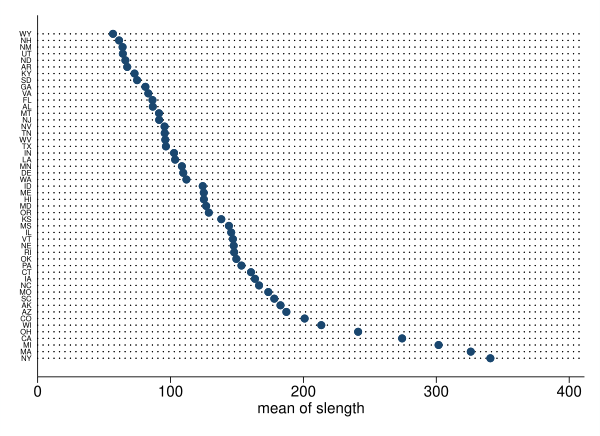

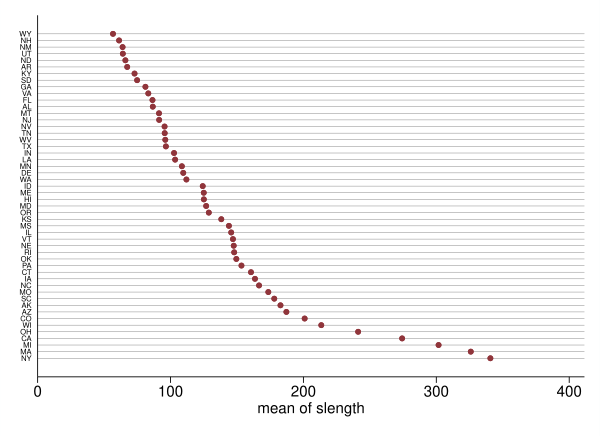

In [7]:
* dot plot 
* follow the same syntax as graph bar
graph dot slength, over(stateabv)

* let's sort by the variable we're presenting, slength
*     default is to sort by the over variable, stateabv
graph dot slength, over(stateabv, sort(slength))

* ugh, the label on the yaxis is too big! Let's shrink it in half
*     using label(labsize(*.5)). Notice that this is inside the 
*     parantheses for the over() option
graph dot slength, over(stateabv, sort(slength) label(labsize(*.5))) /// 
    graphregion(color(white))

* we can control the markers using the marker() option and suboptions
* we can also convert the tiny dots to lines if we want and control the 
*      style of the lines
graph dot slength, over(stateabv, sort(slength) label(labsize(*.5))) ///
    graphregion(color(white)) ///
    marker(1, mcolor(maroon) msize(small)) linetype(line) lines(lwidth(vvthin))



## scatter
The ***twoway scatter*** command creates scatterplots, where every observation receives a marker on the two-dimensional graph. 

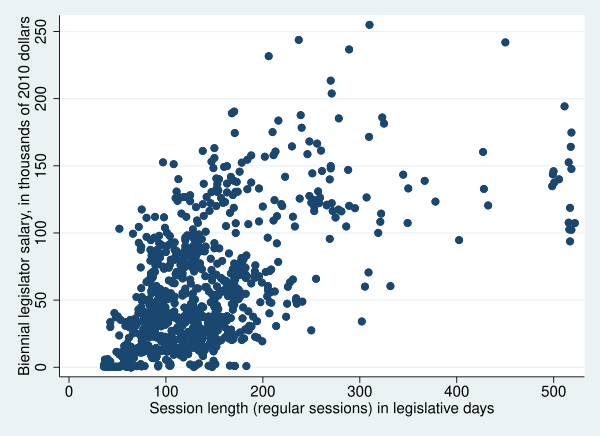

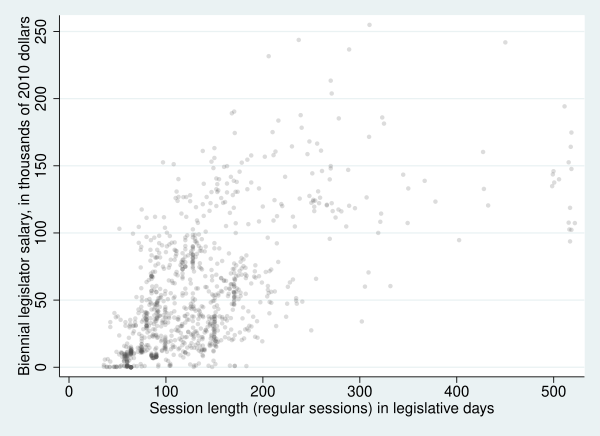

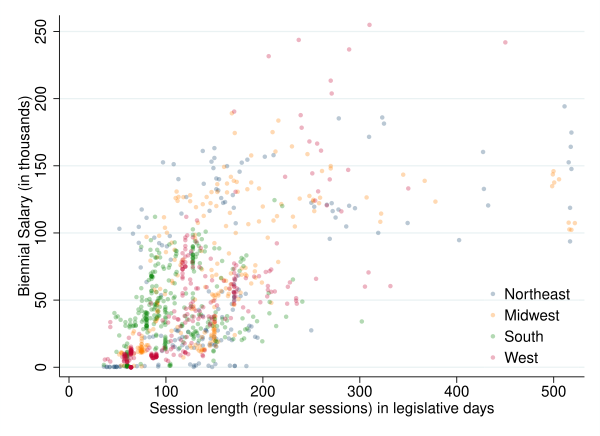








(note: file scatter_legprof.png not found)
(file scatter_legprof.png written in PNG format)


In [8]:
*Scatterplots
*Syntax: twoway scatter y x, options
* series of "m" options control the look of the marker: its size, color, outline width
*     more options are available. Check out the help file for the scatter command
twoway scatter salary_real slength
twoway scatter salary_real slength, msize(small) mcolor(gs5%20) mlwidth(none)

* Use "if" to create scatterplots by region and "||" to put them all on the same plot
* The legend options below place the legend inside the plot region, at the bottom right corner,
*       and in a single column. the region() options get rid of the outline and set the color
*       as mostly transparent
twoway  scatter salary_real slength if region==1, msize(small) mcolor(navy%30) mlwidth(none) || ///
        scatter salary_real slength if region==2, msize(small) mcolor(orange%30) mlwidth(none) || ///
        scatter salary_real slength if region==3, msize(small) mcolor(green%30) mlwidth(none) || ///
        scatter salary_real slength if region==4, msize(small) mcolor(cranberry%30) mlwidth(none) ///
        legend( label(1 "Northeast") label(2 "Midwest") label(3 "South") label(4 "West")) ///
        legend(ring(0) position(5) col(1) region(color(white%10) lstyle(none))) graphregion(color(white)) ///
        ytitle(Biennial Salary (in thousands))

* save the graph to your computer using graph export
*   the width option sets the pixel density
graph export scatter_legprof.png, width(5000) replace


### lowess
The ***twoway lowess*** command creates a lowess plot, which is a moving average of the your dependent variable across your independent variable. It's a nice way to show the relationship between IV and DV in your scatterplot. But, it can over-emphasize outliers, so use it with caution.  ***lowess*** can also be used effectively with ***scatter*** to display both the raw data and relationship between the IV and DV.

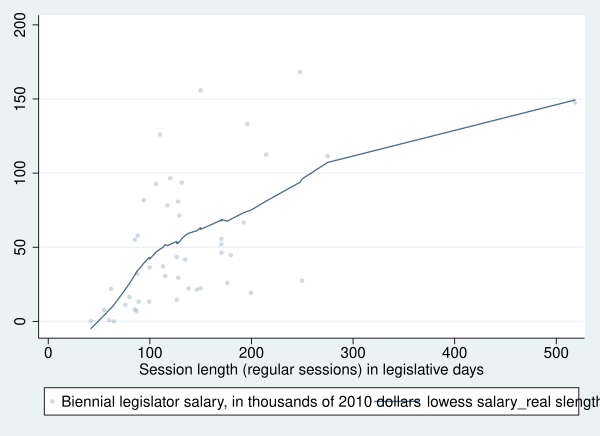

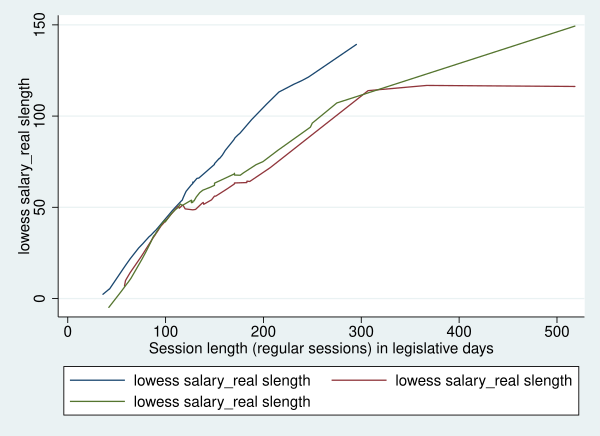

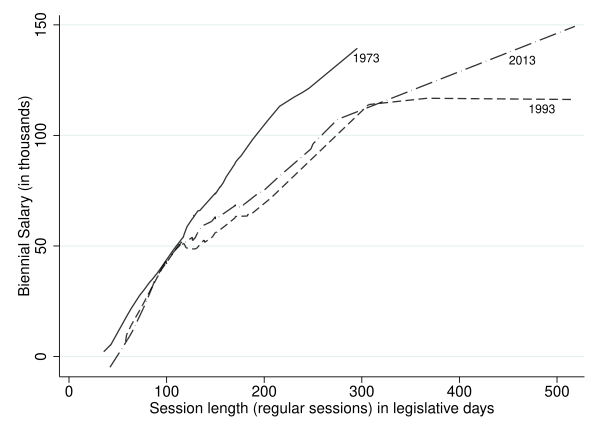

In [9]:
* Lowess smoother
* Works best as a twoway plot:  
*   Syntax: twoway lowess y x, options
twoway scatter salary_real slength if sessid==21, ///
        msize(small) mcolor(navy%20) mlwidth(none) || ///
    lowess salary_real slength if sessid==21, ///
        lcolor(navy%80)

* Can also simply show multiple lowess lines on the same graph
twoway lowess salary_real slength if sessid==1 || ///
    lowess salary_real slength if sessid==11 || ///
    lowess salary_real slength if sessid==21 

* Use "l" options to control look of the line
* text(y x "") allows the user to place text onto the plot
*    the placement(e) means the text sits to the east of the 
*    point specified in the text command. 
*    the size() option controls size of text.
* legend(off) suppresses legend
twoway lowess salary_real slength if sessid==1, ///
        lpattern(solid) lcolor(black%80) || ///
    lowess salary_real slength if sessid==11 , ///
        lpattern(dash) lcolor(black%80) || ///
    lowess salary_real slength if sessid==21, ///
        lpattern(longdash_dot) lcolor(black%80) ///
        graphregion(color(white)) ytitle(Biennial Salary (in thousands)) ///
        text(135 290 "1973", placement(e) size(small)) ///
        text(134 450 "2013", placement(e) size(small)) ///
        text(112 470 "1993", placement(e) size(small)) ///
        legend(off)
        


### line
Line graphs, while common, are some of the least helpful graphs for beginning students. Stata's ***twoway line*** is only an effective presentation of data when there is only a single value of your y variable for a given value on your x variable. Below, I process the data so that we display mean and medians over time to get exactly this situation.

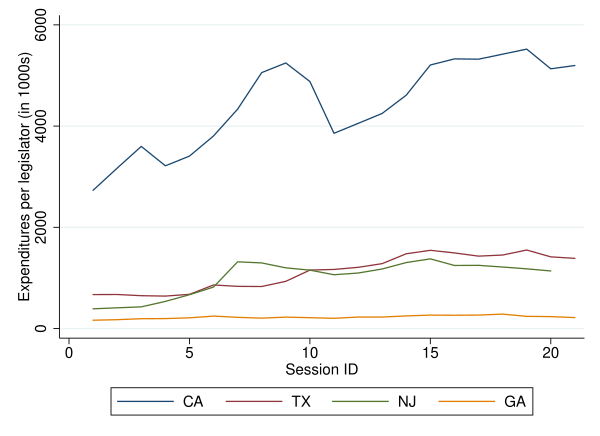

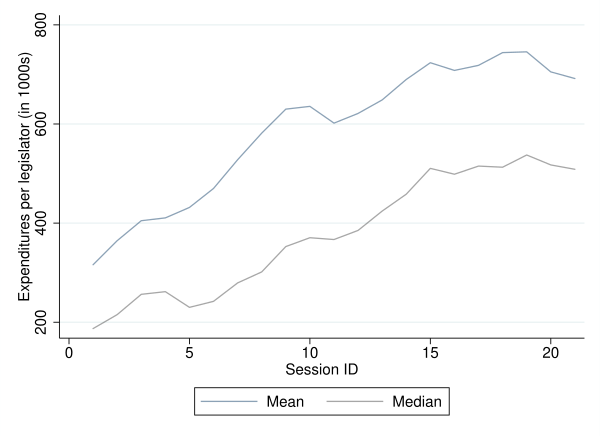

In [10]:
* line graphs
* syntax: twoway line y x, sort
*    the sort option is very important for line graphs, correctly orders 
*    by your x variable

* Key: you need to have only a single value of the DV for each 
*    value of the IV for "twoway line" to work
twoway line expend sessid if stateabv=="CA", sort || ///
    line expend sessid if stateabv=="TX", sort || ///
    line expend sessid if stateabv=="NJ", sort || ///
    line expend sessid if stateabv=="GA", sort ///
    legend(label(1 "CA") label(2 "TX") label(3 "NJ") label(4 "GA") ///
    rows(1) ) ytitle(Expenditures per legislator (in 1000s)) ///
    graphregion(color(white))

* Or, we could calculate the mean and median value by year
* Use the egen command (extensions on generate) 
* Check out the help file by typing "help egen" in command line

*drop new vars if already created 
capture drop mn_expend med_expend

*generate mean and median by legislative session by
*      calling up the mean() and median() functions
*      built into egen command
egen mn_expend = mean(expend), by(sessid)
egen med_expend = median(expend), by(sessid)

* the lwidth and lcolor options control the look of the lines
twoway line mn_expend sessid, sort lwidth(medium) lcolor(navy%50) || ///
    line med_expend sessid, sort lwidth(medium) lcolor(gs5%50) ///
    legend(label(1 "Mean") label(2 "Median") rows(1) ) ///
    ytitle(Expenditures per legislator (in 1000s)) ///
    graphregion(color(white))
